In [2]:
#%matplotlib inline
import torch
import torch.nn as nn
from torchvision.datasets import CelebA
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import make_grid
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from tqdm.auto import tqdm
torch.manual_seed(0) # Set for reproducibility

## Generative Adversarial Network (GAN)

Generative Adversarial Networks are machine learning architectures where two deep neaural networks compete with each other to create realistic outputs. GANs achieve this level of realism by pairing a generator, which learns to produce the target output, with a discriminator, which learns to distinguish true data from the output of the generator. The generator tries to fool the discriminator, and the discriminator tries to keep from being fooled.
![dcgan](img/gan_diagram.svg)

In this case, the GAN type used to generate human-like faces is a Deep Convolutional Generative Adversarial Network (DCGAN). This type of GAN includes convolutional layers in its architecture and is more adapted for image datasets. 
![dcgan](img/dcgan-gen.png)

### Specify input parameters

To build and train the model we will first specify a few parameters:
- batch_size: the number of images per forward/backward pass
- image_size: the size of the images used for training. This implementation defaults to 64x64. If another size is desired, the structures of discriminator and generator must be changed.
- device: the device type
- z_dim: the dimension of the noise vector

In [3]:
batch_size = 128
image_size = 64
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

z_dim = 64 

### Load the data

#### CelebA
For this experiment, we will be using [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html). CelebA is a dataset of annotated celebrity images. Since they are colored (not black-and-white), the images have three channels for red, green, and blue (RGB).

![celeba](img/celeba.png)

In [232]:
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

dataloader = DataLoader(
    CelebA(".", split='train', download=True, transform=transform),
    batch_size=batch_size,
    shuffle=True,
    num_workers=8)

Files already downloaded and verified


Let's plot some training images.

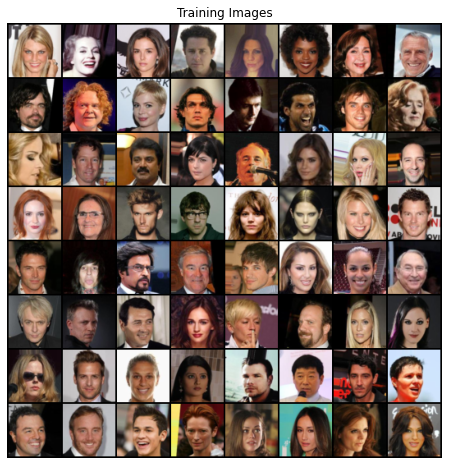

In [634]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

### Generator

The generator part of GAN will take as input a random noise vector and learn to create fake data by incorporating feedback from the discriminator. It learns to make the discriminator classify its output as real.

The generator never 'sees' the real images, it is only guided by the discriminator feedback on its 'own creations'.

In [6]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (CelebA is rgb, so 3 is the default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=3, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 8, stride=1, padding=0),
            self.make_gen_block(hidden_dim * 8, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=4, stride=2, padding=1, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            padding: the amount of implicit zero-paddings on both sides of the output feature representation
            bias: a boolean, false meaning no bias included
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride, padding),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride, padding),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

In [7]:
gen = Generator(z_dim).to(device)
print(gen)

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(64, 512, kernel_size=(4, 4), stride=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Sequential(
      (0): ConvTra

### Discriminator

The discriminator in a GAN is simply a classifier. It tries to distinguish real data from the data created by the generator. It could use any network architecture appropriate to the type of data it's classifying.

In [11]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (CelebA is rgb, so 3 is our default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=3, hidden_dim=64):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, hidden_dim * 4),
            self.make_disc_block(hidden_dim * 4, hidden_dim * 8),
            self.make_disc_block(hidden_dim * 8, 1, stride=1, padding=0, final_layer=True),
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, padding=1, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride, padding),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride, padding),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

In [12]:
disc = Discriminator().to(device) 
print(disc)

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyR

### BCE loss

We will next use the Binary Cross Entropy Loss to train the network and specify the trainig parameters:
- lr: learning rate for optimizers. A learning rate of 0.0002 works well on DCGAN
- beta_1 and beta_2: these parameters control the optimizer's momentum

In [8]:
criterion = nn.BCEWithLogitsLoss()

lr = 0.0002
beta_1 = 0.5 
beta_2 = 0.999

In [13]:
# Configure the Adam aptimiser for both generator
# and discriminator
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr, betas=(beta_1, beta_2))

# Initialize the weights to the normal distribution
# with mean 0 (1 for BatchNorm) and standard deviation 0.02
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 1.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

Set some helper functions to:
- create the noise vector as the input to the generator
- display generated and real images during training
- save the generator and discriminator at the end of every training epoch

In [14]:
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

In [15]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [16]:
def save_model(state_dict, name, epoch):
    '''
    Function to save the trained neural net, optimizer and epoch
    Parameters:
        state_dict: dictionary of states from the (De-)Convolutional Neural Network, optimizer and epoch
        name: name of the Neural Network
        epoch: current epoch
    '''
    print('Saving trained model {} at epoch {}.'.format(name, epoch))
    if not os.path.exists('model'):
        os.makedirs('model')
    model_name = 'dcgan_{}_{}.pth'.format(name, epoch)
    model_path = os.path.join('./model', model_name)
    torch.save(state_dict, model_path)

### Train the GAN

The generator and discriminator will train to produce realistic human face images. 

Epoch: 0/25 Step: 1000 Generator loss: 8.806983748912822 Discriminator loss: 0.02593227530352308


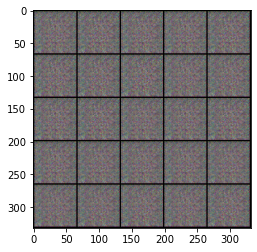

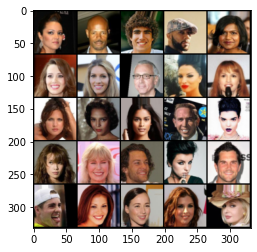


Saving trained model generator at epoch 1.
Saving trained model discriminator at epoch 1.


Epoch: 1/25 Step: 2000 Generator loss: 5.912511358110001 Discriminator loss: 0.24516184735493127


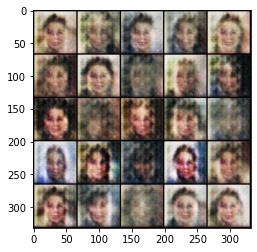

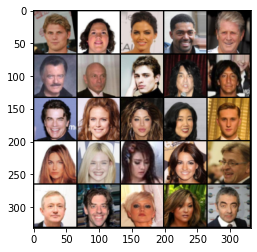


Saving trained model generator at epoch 2.
Saving trained model discriminator at epoch 2.


Epoch: 2/25 Step: 3000 Generator loss: 4.315407178819183 Discriminator loss: 0.31304728794097875


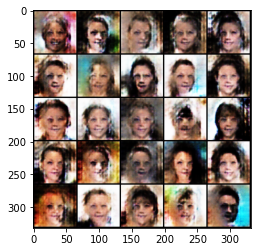

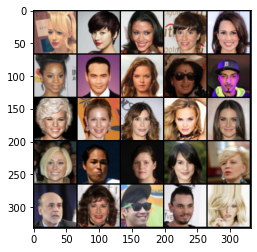


Saving trained model generator at epoch 3.
Saving trained model discriminator at epoch 3.


Epoch: 3/25 Step: 4000 Generator loss: 3.7529047792404886 Discriminator loss: 0.28675805904716256


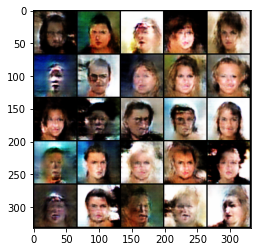

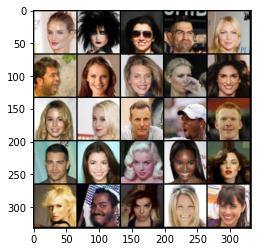

Epoch: 3/25 Step: 5000 Generator loss: 3.1934016133546805 Discriminator loss: 0.30312063329666855


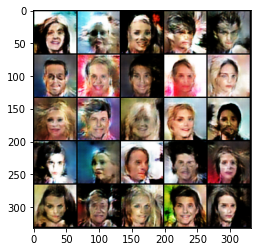

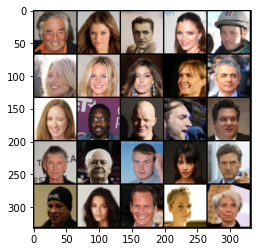


Saving trained model generator at epoch 4.
Saving trained model discriminator at epoch 4.


Epoch: 4/25 Step: 6000 Generator loss: 2.7295920179933315 Discriminator loss: 0.3399755398184062


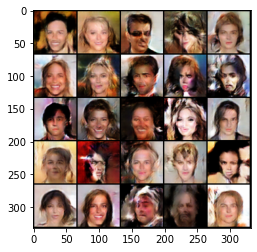

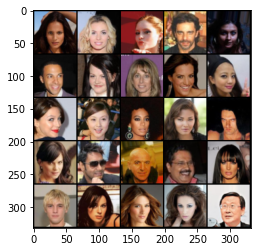


Saving trained model generator at epoch 5.
Saving trained model discriminator at epoch 5.


Epoch: 5/25 Step: 7000 Generator loss: 2.4212873318344337 Discriminator loss: 0.37765035484731185


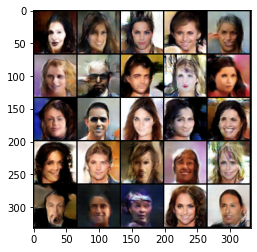

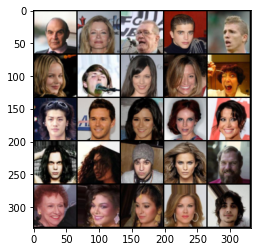


Saving trained model generator at epoch 6.
Saving trained model discriminator at epoch 6.


Epoch: 6/25 Step: 8000 Generator loss: 2.270887161411345 Discriminator loss: 0.3990228955447675


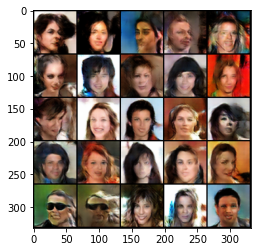

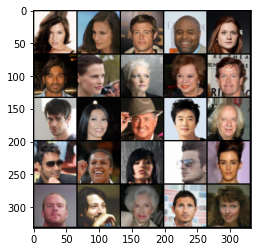


Saving trained model generator at epoch 7.
Saving trained model discriminator at epoch 7.


Epoch: 7/25 Step: 9000 Generator loss: 2.165428003579377 Discriminator loss: 0.40320571602881006


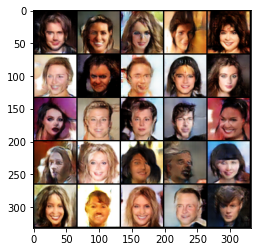

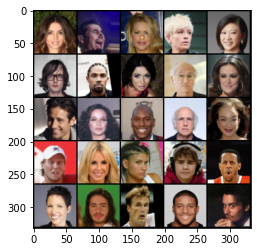

Epoch: 7/25 Step: 10000 Generator loss: 2.1327550319880255 Discriminator loss: 0.4042168606668712


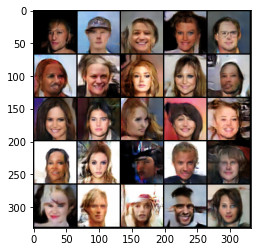

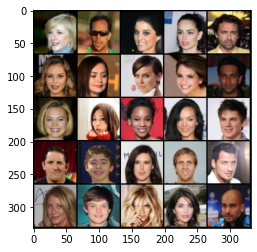


Saving trained model generator at epoch 8.
Saving trained model discriminator at epoch 8.


Epoch: 8/25 Step: 11000 Generator loss: 2.118687268719077 Discriminator loss: 0.40061009372770773


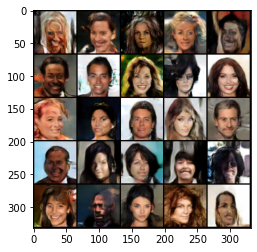

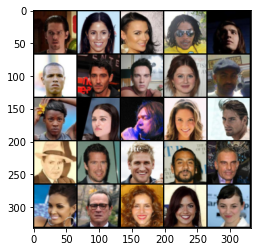


Saving trained model generator at epoch 9.
Saving trained model discriminator at epoch 9.


Epoch: 9/25 Step: 12000 Generator loss: 2.140764198347924 Discriminator loss: 0.3882344099879266


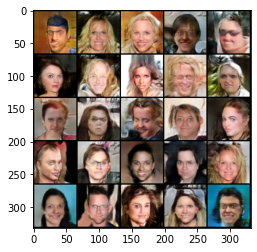

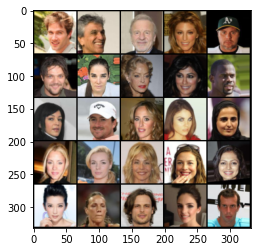


Saving trained model generator at epoch 10.
Saving trained model discriminator at epoch 10.


Epoch: 10/25 Step: 13000 Generator loss: 2.1891257886402307 Discriminator loss: 0.37744904930889633


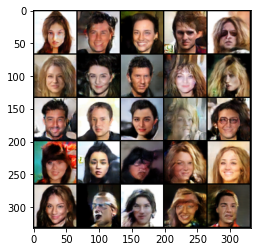

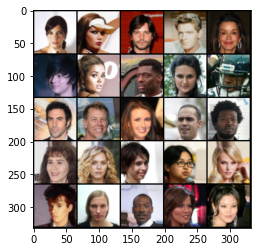


Saving trained model generator at epoch 11.
Saving trained model discriminator at epoch 11.


Epoch: 11/25 Step: 14000 Generator loss: 2.2596265084445495 Discriminator loss: 0.3661271722763776


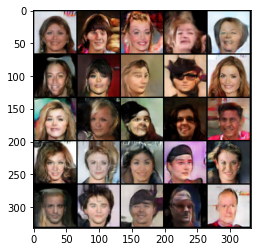

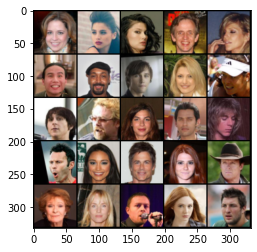

Epoch: 11/25 Step: 15000 Generator loss: 2.332476011186838 Discriminator loss: 0.33481242920458293


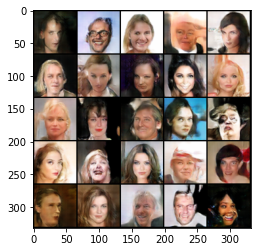

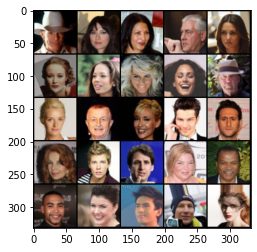


Saving trained model generator at epoch 12.
Saving trained model discriminator at epoch 12.


Epoch: 12/25 Step: 16000 Generator loss: 2.4532229394167624 Discriminator loss: 0.3027675375267858


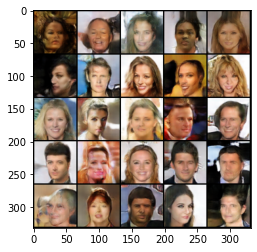

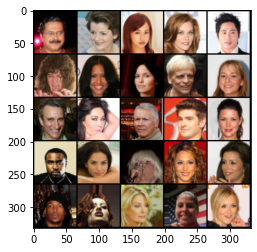


Saving trained model generator at epoch 13.
Saving trained model discriminator at epoch 13.


Epoch: 13/25 Step: 17000 Generator loss: 2.509123437531296 Discriminator loss: 0.31966623559594126


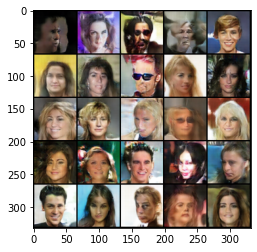

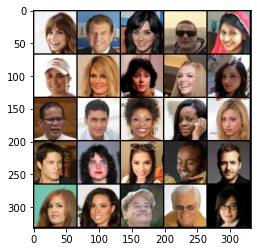


Saving trained model generator at epoch 14.
Saving trained model discriminator at epoch 14.


Epoch: 14/25 Step: 18000 Generator loss: 2.5727769709806907 Discriminator loss: 0.307361209973693


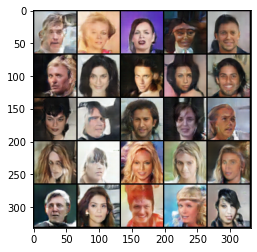

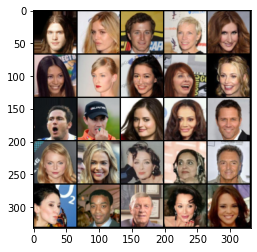

Epoch: 14/25 Step: 19000 Generator loss: 2.651368810401301 Discriminator loss: 0.28751830831170094


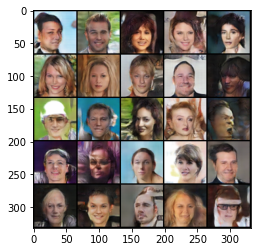

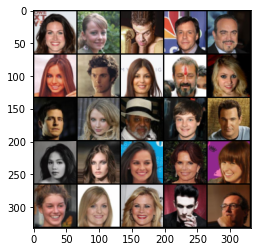


Saving trained model generator at epoch 15.
Saving trained model discriminator at epoch 15.


Epoch: 15/25 Step: 20000 Generator loss: 2.7350076526662885 Discriminator loss: 0.2728229470998051


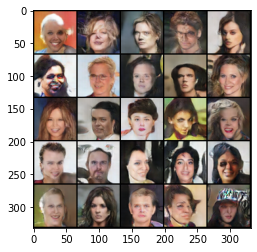

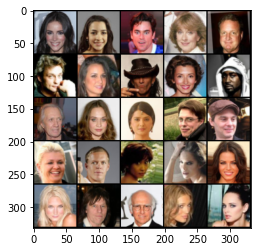


Saving trained model generator at epoch 16.
Saving trained model discriminator at epoch 16.


Epoch: 16/25 Step: 21000 Generator loss: 2.8610984929800045 Discriminator loss: 0.2423840665519238


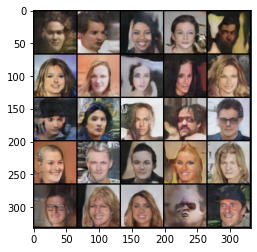

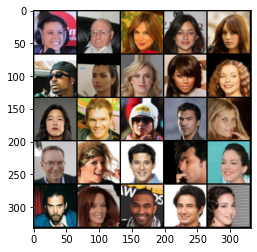


Saving trained model generator at epoch 17.
Saving trained model discriminator at epoch 17.


Epoch: 17/25 Step: 22000 Generator loss: 2.9248787500858264 Discriminator loss: 0.24933787243813293


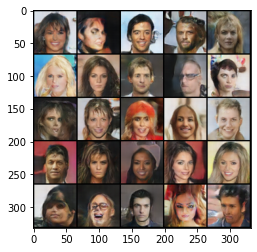

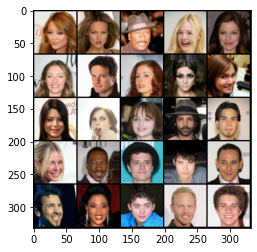


Saving trained model generator at epoch 18.
Saving trained model discriminator at epoch 18.


Epoch: 18/25 Step: 23000 Generator loss: 2.990652165310457 Discriminator loss: 0.23774229045584794


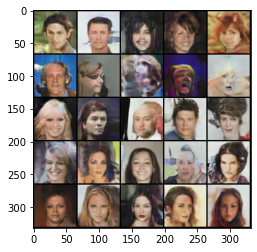

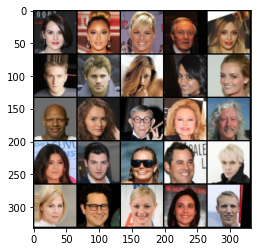

Epoch: 18/25 Step: 24000 Generator loss: 3.141412671454254 Discriminator loss: 0.22077147404477007


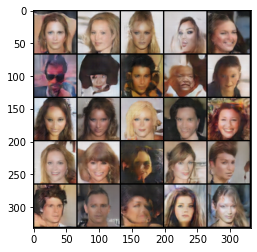

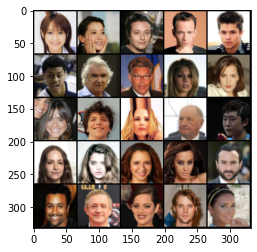


Saving trained model generator at epoch 19.
Saving trained model discriminator at epoch 19.


Epoch: 19/25 Step: 25000 Generator loss: 3.169142767425622 Discriminator loss: 0.21952994893118755


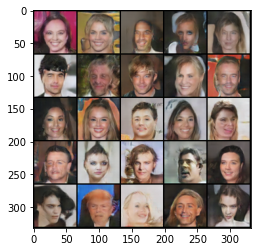

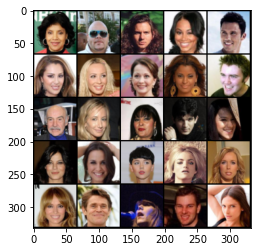


Saving trained model generator at epoch 20.
Saving trained model discriminator at epoch 20.


Epoch: 20/25 Step: 26000 Generator loss: 3.301563221938907 Discriminator loss: 0.2009753744639459


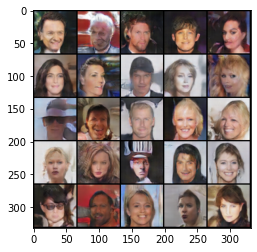

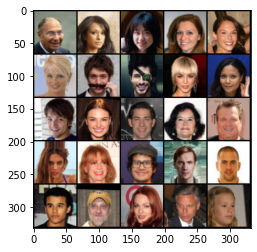


Saving trained model generator at epoch 21.
Saving trained model discriminator at epoch 21.


Epoch: 21/25 Step: 27000 Generator loss: 3.4120976772308365 Discriminator loss: 0.18303799765556994


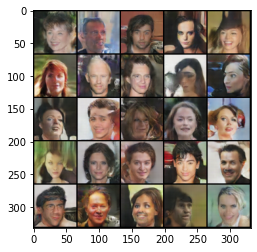

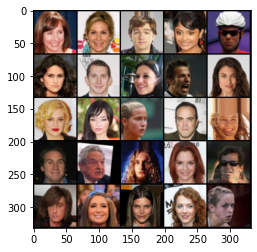


Saving trained model generator at epoch 22.
Saving trained model discriminator at epoch 22.


Epoch: 22/25 Step: 28000 Generator loss: 3.4029288251847007 Discriminator loss: 0.20569949556887152


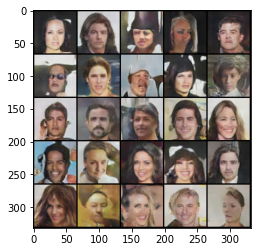

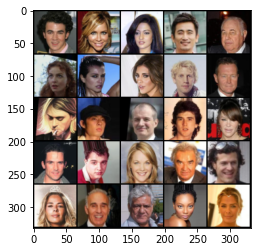

Epoch: 22/25 Step: 29000 Generator loss: 3.555172959107903 Discriminator loss: 0.1748053628690539


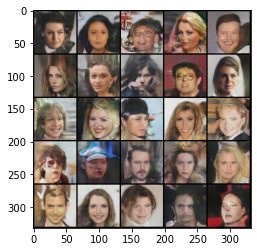

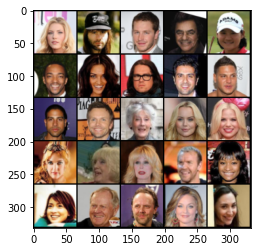


Saving trained model generator at epoch 23.
Saving trained model discriminator at epoch 23.


Epoch: 23/25 Step: 30000 Generator loss: 3.5840952757042817 Discriminator loss: 0.1849349939785898


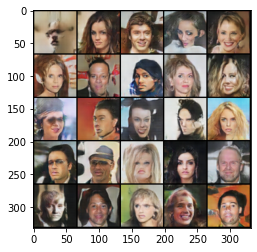

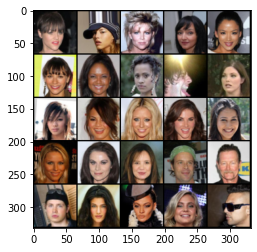


Saving trained model generator at epoch 24.
Saving trained model discriminator at epoch 24.


Epoch: 24/25 Step: 31000 Generator loss: 3.590621839412468 Discriminator loss: 0.20295699719153357


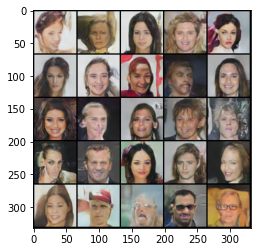

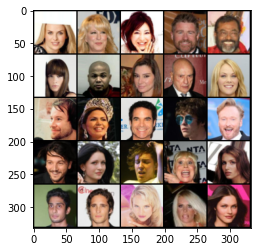


Saving trained model generator at epoch 25.
Saving trained model discriminator at epoch 25.


In [30]:
display_step = 1000
n_epochs = 25
cur_step = 0

mean_generator_loss = 0
mean_discriminator_loss = 0

gen_losses = []
dics_losses = []

# For each epoch
for epoch in range(n_epochs):
    # For each batch in the dataloader
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)
        ## Update discriminator ##
        disc_opt.zero_grad()
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        fake = gen(fake_noise)
        disc_fake_pred = disc(fake.detach())
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_pred = disc(real)
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step
        dics_losses.append(disc_loss.item())
        # Update gradients
        disc_loss.backward(retain_graph=True)
        # Update optimizer
        disc_opt.step()

        ## Update generator ##
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        disc_fake_pred = disc(fake_2)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step
        gen_losses.append(gen_loss.item())
        
        ## Visualization code ##
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch: {epoch}/{n_epochs} Step: {cur_step} Generator loss: {mean_generator_loss} Discriminator loss: {mean_discriminator_loss}")
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
            
        cur_step += 1
    save_model({
        'epoch': epoch + 1,
        'state_dict': gen.state_dict(),
        'optimizer': gen_opt.state_dict()
    }, 'generator', int(epoch + 1))

    save_model({
        'epoch': epoch + 1,
        'state_dict': disc.state_dict(),
        'optimizer': disc_opt.state_dict()
    }, 'discriminator', int(epoch + 1))

## Identifying bias in GANs

Next, we are going to explore a way to identify some biases of a GAN using a classifier. This approach aims to detect potential bias by analyzing correlations in feature classifications on the generated images. 

Note that not all biases are as obvious as the ones presented below.

### Classifier

The classifier will learn to distinguish between the labeled 40 classes in the CelebA dataset. 

In [234]:
class Classifier(nn.Module):
    '''
    Classifier Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (CelebA is rgb, so 3 is your default)
        n_classes: the total number of classes in the dataset, an integer scalar
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=3, n_classes=2, hidden_dim=64):
        super(Classifier, self).__init__()
        self.classifier = nn.Sequential(
            self.make_classifier_block(im_chan, hidden_dim),
            self.make_classifier_block(hidden_dim, hidden_dim * 2),
            self.make_classifier_block(hidden_dim * 2, hidden_dim * 4, stride=3),
            self.make_classifier_block(hidden_dim * 4, n_classes, final_layer=True),
        )

    def make_classifier_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a classifier block; 
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the classifier: Given an image tensor, 
        returns an n_classes-dimension tensor representing classes.
        Parameters:
            image: a flattened image tensor with im_chan channels
        '''
        class_pred = self.classifier(image)
        return class_pred.view(len(class_pred), -1)

In [259]:
# number of CelebA classes
label_indices = range(40)

classifier = Classifier(n_classes=len(label_indices)).to(device)
print(classifier)

Classifier(
  (classifier): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(3, 3))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(256, 40, kernel_size=(4, 4), stride=(2, 2))
    )
  )
)


### Train the classifier

For this we will equally use the Binary Cross Entropy Loss and the Adam optimiser but with slightly adjusted parameters.

In [260]:
criterion = nn.BCEWithLogitsLoss()
lr = 0.001
beta_1 = 0.5
beta_2 = 0.999

class_opt = torch.optim.Adam(classifier.parameters(), lr=lr, betas=(beta_1, beta_2))

The CelebA dataset includes a 'Male' feature but no 'Female' one. However, it is safe to assume that a picture marked with a positive label as 'Male' would correspond to a negative label of 'Female'. Therefore we can reverse the 'Male' labels a train the classifier for a 'Female' feature.

Step 500: Classifier loss: 0.2697671493291855


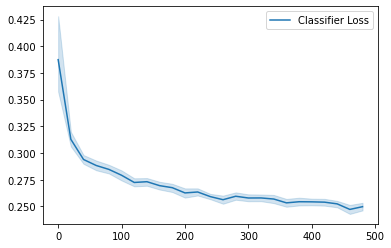

Step 1000: Classifier loss: 0.24335927894711495


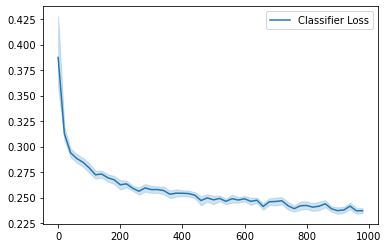

Step 1500: Classifier loss: 0.23221051445603372


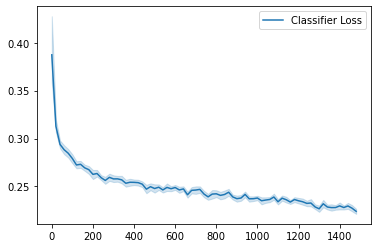

Step 2000: Classifier loss: 0.2260861761868


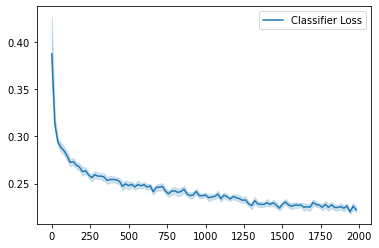

Step 2500: Classifier loss: 0.22416675943136216


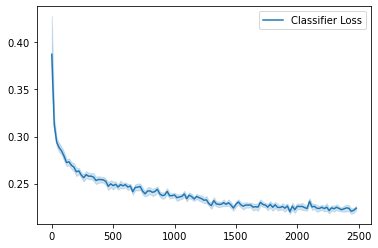

Step 3000: Classifier loss: 0.2162532505095005


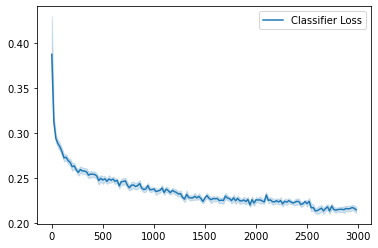

Step 3500: Classifier loss: 0.21616276437044143


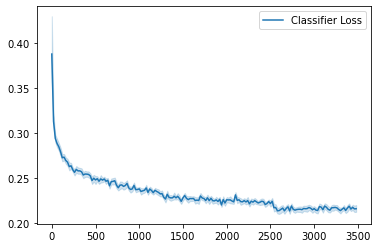


Saving trained model classifier at epoch 3.


In [261]:
image_size = 64
n_epochs = 3
display_step = 500

cur_step = 0
classifier_losses = []

# classifier_val_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, labels in tqdm(dataloader):
        real = real.to(device)
        labels = labels[:, label_indices].to(device).float()
        
        reverse_tensor = torch.ones(labels.shape[0]).to(device) # delete the row to train for 'Male' feature
        labels[:,20] = reverse_tensor - labels[:,20] # delete the row to train for 'Male' feature

        class_opt.zero_grad()
        class_pred = classifier(real)
        class_loss = criterion(class_pred, labels)
        class_loss.backward() # Calculate the gradients
        class_opt.step() # Update the weights
        classifier_losses += [class_loss.item()] # Keep track of the average classifier loss

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            class_mean = sum(classifier_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Classifier loss: {class_mean}")
            step_bins = 20
            x_axis = sorted([i * step_bins for i in range(len(classifier_losses) // step_bins)] * step_bins)
            sns.lineplot(x_axis, classifier_losses[:len(x_axis)], label="Classifier Loss")
            plt.legend()
            plt.show()
        cur_step += 1
    if epoch == (n_epochs-1):
        save_model({
            'state_dict': classifier.state_dict(),
            }, 'classifier', int(epoch + 1))

### Load the pre-trained models

Here we load the trained generator and the classifier trained with the 'Female' feature. A classifier trained with the 'Male' feature is also available in the `model` folder.

In [262]:
gen = Generator(z_dim).to(device)
gen_dict = torch.load("model/dcgan_generator_25.pth", map_location=torch.device(device))["state_dict"]
gen.load_state_dict(gen_dict)
gen.eval()

n_classes = 40
classifier = Classifier(n_classes=n_classes).to(device)
# change to 'model/dcgan_classifier_3_female.pth' for the model trained on the 'Male' feature
class_dict = torch.load("model/dcgan_classifier_3_female.pth", map_location=torch.device(device))["state_dict"] 
classifier.load_state_dict(class_dict)
classifier.eval()
print("Loaded the models!")

opt = torch.optim.Adam(classifier.parameters(), lr=0.01)

Loaded the models!


### Feature correlation

Now we can generate images using the generator and, by also using the classifier, generate images with different amounts of the 'Female' feature.

In [263]:
# generate a bunch of fake images with the generator
n_images = 256
fake_image_history = []
classification_history = []
grad_steps = 30 # how many gradient steps to take
skip = 2 # how many gradient steps to skip in the visualization

feature_names = ["5oClockShadow", "ArchedEyebrows", "Attractive", "BagsUnderEyes", "Bald", "Bangs",
"BigLips", "BigNose", "BlackHair", "BlondHair", "Blurry", "BrownHair", "BushyEyebrows", "Chubby",
"DoubleChin", "Eyeglasses", "Goatee", "GrayHair", "HeavyMakeup", "HighCheekbones", "Female", # change 'Female' to 'Male' for male model
"MouthSlightlyOpen", "Mustache", "NarrowEyes", "NoBeard", "OvalFace", "PaleSkin", "PointyNose", 
"RecedingHairline", "RosyCheeks", "Sideburn", "Smiling", "StraightHair", "WavyHair", "WearingEarrings", 
"WearingHat", "WearingLipstick", "WearingNecklace", "WearingNecktie", "Young"]

n_features = len(feature_names)
# set the target feature
target_feature = "Female" # change 'Female' to 'Male' for male model
target_indices = feature_names.index(target_feature)
noise = get_noise(n_images, z_dim).to(device)
new_noise = noise.clone().requires_grad_()
starting_classifications = classifier(gen(new_noise)).cpu().detach()

# additive direction (more of a feature)
for i in range(grad_steps):
    opt.zero_grad()
    fake = gen(new_noise)
    fake_image_history += [fake]
    classifications = classifier(fake)
    classification_history += [classifications.cpu().detach()]
    fake_classes = classifications[:, target_indices].mean()
    fake_classes.backward()
    new_noise.data += new_noise.grad / grad_steps

# subtractive direction (less of a feature)
new_noise = noise.clone().requires_grad_()
for i in range(grad_steps):
    opt.zero_grad()
    fake = gen(new_noise)
    fake_image_history += [fake]
    classifications = classifier(fake)
    classification_history += [classifications.cpu().detach()]
    fake_classes = classifications[:, target_indices].mean()
    fake_classes.backward()
    new_noise.data -= new_noise.grad / grad_steps

classification_history = torch.stack(classification_history)

In [644]:
print(classification_history.shape)
print(starting_classifications[None, :, :].shape)

torch.Size([60, 256, 40])
torch.Size([1, 256, 40])


Let us plot some of the best images created by our generator. 

In [625]:
nice_images = [0,2,9,11,13,15,17,30,
               35,39,40,46,53,60,70,72,
               84,85,92,93,94,97,99,100,
               103,106,107,114,115,116,121,130,
               140,141,147,151,153,156,158,166,
               168,169,170,173,176,184,186,188,
               195,197,198,200,211,218,220,222,
               223,224,226,228,234,235,243,244]

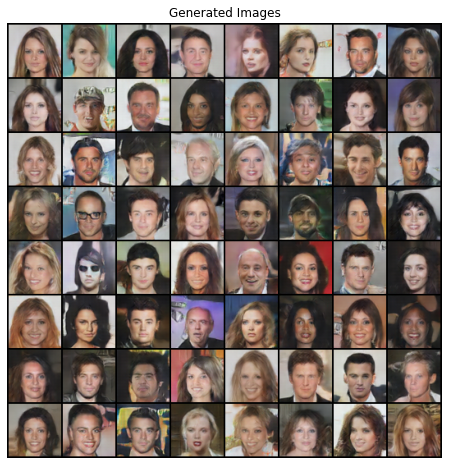

In [641]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Generated Images")
plt.imshow(np.transpose(make_grid(fake_image_history[0][[nice_images]][:64], padding=2, normalize=True).detach().cpu().numpy(),(1,2,0)))
plt.savefig('./img/generated_img.png')
plt.show()

#### Visualise bias

The generated samples have increasing or decreasing amounts of the target feature - 'Female'. We can visualize the way in which this affects other classified features. The x-axis will show the amount of change in our target feature and the y-axis shows how much the other features change, as detected in those images by the classifier. We are thus able to see the covariance of "female-ness" and other features.

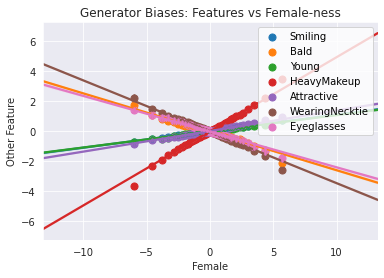

In [646]:
# set other selected features
other_features = ["Smiling", "Bald", "Young", "HeavyMakeup", "Attractive", "WearingNecktie", "Eyeglasses"]
classification_changes = (classification_history - starting_classifications[None, :, :]).numpy()
for other_feature in other_features:
    other_indices = feature_names.index(other_feature)
    with sns.axes_style("darkgrid"):
        sns.regplot(
            classification_changes[:, :, target_indices].reshape(-1), 
            classification_changes[:, :, other_indices].reshape(-1), 
            fit_reg=True,
            truncate=True,
            ci=99,
            x_ci=99,
            x_bins=len(classification_history),
            label=other_feature
        )
plt.xlabel(target_feature)
plt.ylabel("Other Feature")
plt.title(f"Generator Biases: Features vs {target_feature}-ness")
plt.legend(loc=1)
plt.savefig('./img/female-ness_bias.png')
plt.show()

It is important to build awareness on bias and this correlation detection can be further used to reduce bias by penalizing this type of correlation in the loss during the training of the generator. However, currently there is no rigorous and accepted solution for debiasing GANs.

'Outside' the model, a step in preventing bias is to make sure that the dataset is inclusive and representative, and mitigate the biases resulting from whatever data collection method used—for example, getting a representative labelers for the task. 

Nevertheless, a diverse dataset alone is not enough to eliminate bias. Even diverse datasets can reinforce existing structural biases by simply capturing common social biases ('female-ness' being negatively correlated with wearing a necktie). Mitigating these biases is an important and active area of research.

#### Quantify bias

Finally, we can equally quantitatively evaluate the degree to which these factors covary. Given a target index, for example corresponding to 'Female,' we will rank other features that covary with that target feature the most. This includes large negative and positive covariances.

In [267]:
def get_top_covariances(classification_changes, target_index, top_n=10):
    '''
    Function for getting the top n covariances: Given a list of classification changes
    and the index of the target feature, returns (1) a list or tensor (numpy or torch) of the indices
    corresponding to the n features that covary most with the target in terms of absolute covariance
    and (2) a list or tensor (numpy or torch) of the degrees to which they covary.
    Parameters:
        classification_changes: relative changes in classifications of each generated image 
          resulting from optimizing the target feature (see above for a visualization)
        target_index: the index of the target feature, a scalar
        top_n: the top most number of elements to return, default is 10
    '''
    _, _, s = classification_changes.shape
    classification_changes = classification_changes.reshape(-1, s)
    cov_matrix = np.cov(classification_changes, rowvar=False)
    relevant_indices = np.abs(cov_matrix[target_index, :]).argsort()[::-1]
    relevant_indices = relevant_indices[relevant_indices!= target_index][:top_n] 
    highest_covariances = cov_matrix[:, relevant_indices][target_index]
    return relevant_indices, highest_covariances

In [647]:
# this returns the top 10 features with highest covariance (negative and positive) with the 'Female' feature
relevant_indices, highest_covariances = get_top_covariances(classification_changes, target_indices, top_n=10)

for index, covariance in zip(relevant_indices, highest_covariances):
    print(f"{feature_names[index]}  {covariance:f}")

WearingLipstick  2.839798
HeavyMakeup  2.501494
NoBeard  2.127061
5oClockShadow  -1.849787
WearingNecktie  -1.733796
Sideburn  -1.730549
Goatee  -1.519677
Mustache  -1.502830
Bald  -1.296670
BlondHair  1.246212


One of the major sources of difficulty with identifying bias and fairness is that there are many ways to reasonably define these terms. Here are three ways that are computationally useful and [widely referenced](http://m-mitchell.com/papers/Adversarial_Bias_Mitigation.pdf). They are, by no means, the only definitions of fairness (see more details [here](https://developers.google.com/machine-learning/glossary/fairness)):

1.   Demographic parity: the overall distribution of the predictions made by a predictor is the same for different values of a protected class. 
2.   Equality of odds: all else being equal, the probability that you predict correctly or incorrectly is the same for different values of a protected class. 
2.   Equality of opportunity: all else being equal, the probability that you predict correctly is the same for different valus of a protected class (weaker than equality of odds).

#### Note on CelebA
The CelebA dataset has many inherent biases. This is because the data includes celebrities and politians who are representatives of certain social classes where racial bias could be important. In addition, CelebA dataset labels had no serious consideration for diversity and make the task even harder for certain features like 'young', celebrities appear much younger than someone the same age who is not a celebrity — creating bias for classifying older people, and, of couse, most of the time 'smiling'. The data represents the biases of their labelers, of the dataset creators, the social biases, and many others. 